In [5]:
#Importer les Librairies traitement image 
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import skimage


#importer les librairies utilitaires 
import pathlib
import math
import random

Nombre d'images chargées : 9


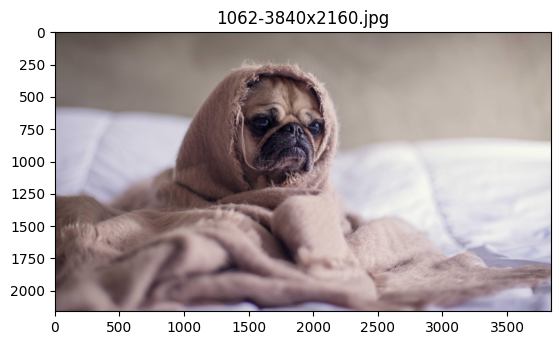

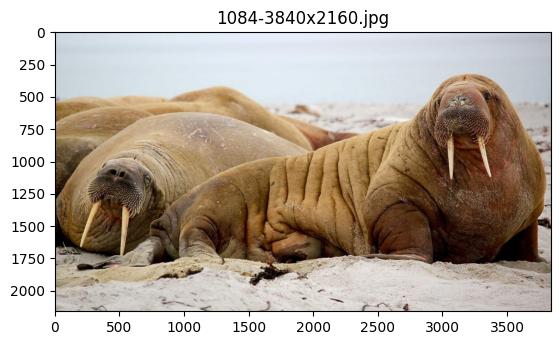

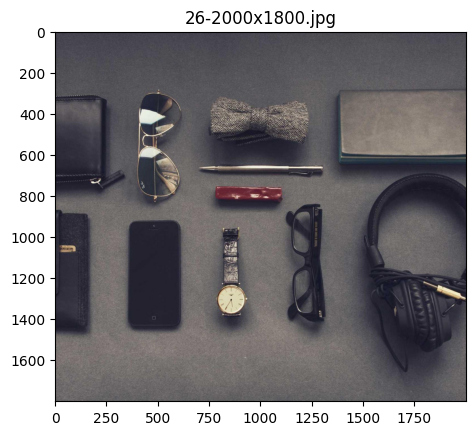

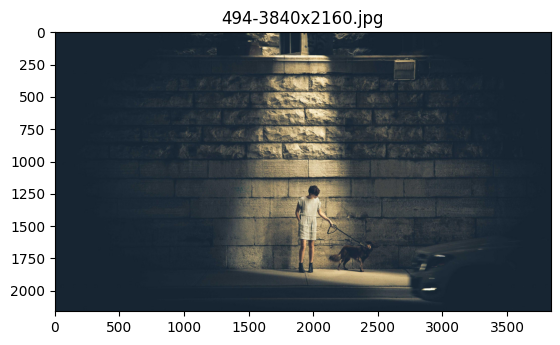

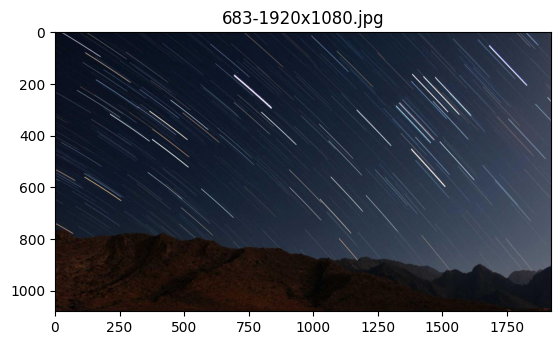

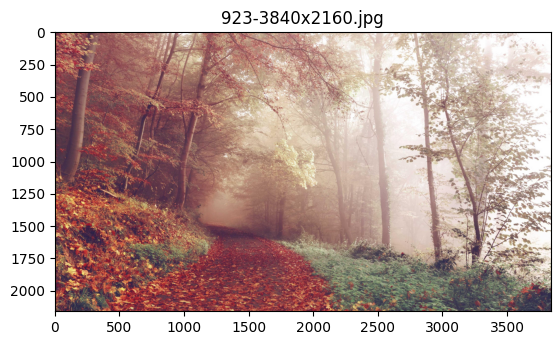

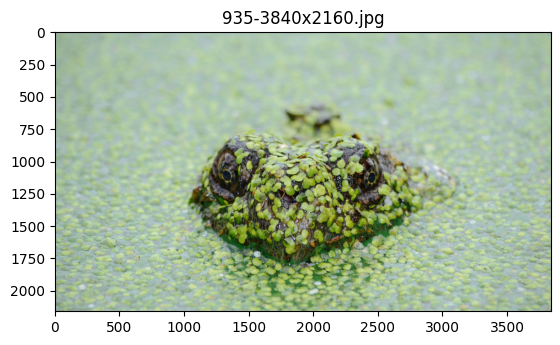

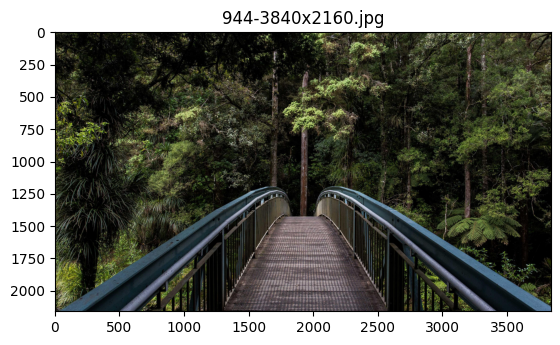

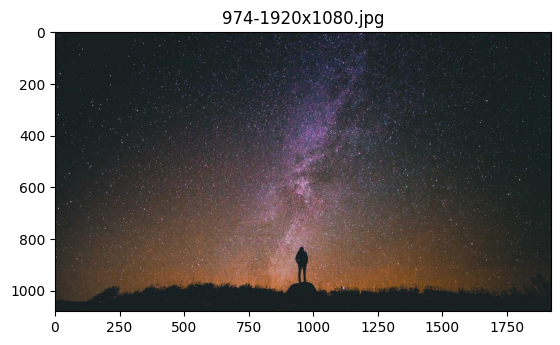

In [6]:
#chargement du dataset
images = list(pathlib.Path('photo').iterdir())
print(f"Nombre d'images chargées : {len(images)}")

#Affichage des images chachune dans un plot différent
for img in images : 
    plt.figure()

    plt.title(img.name)

    img = plt.imread(img)

    plt.imshow(img)

In [7]:
def chooseRandomImg():
    img = plt.imread(images[random.randint(0, len(images)-1)])
    
    return img

Text(0.5, 1.0, 'Image de croppé')

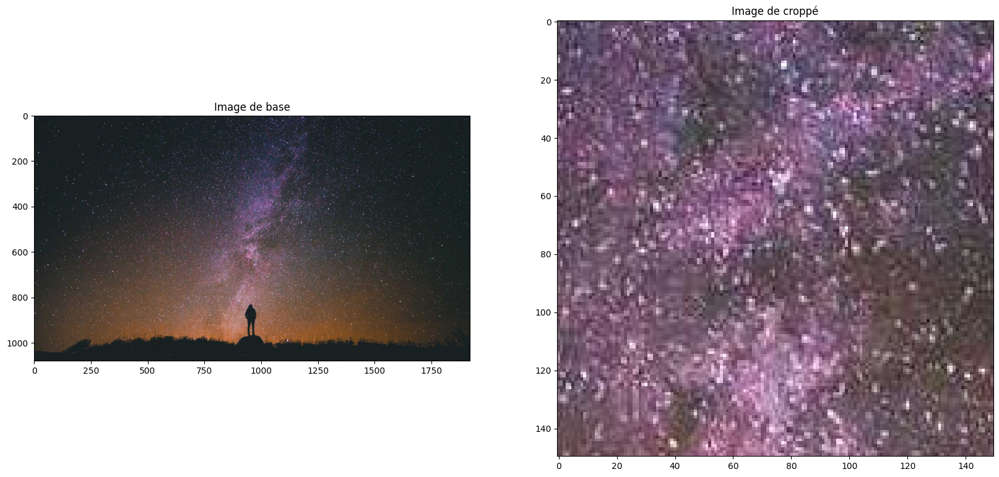

In [8]:
#Cropper les images
def center_crop(img, width = None, height = None):
    assert width or height, 'Précisez au moins une dimension'
    width = width or height
    height = height or width

    org_height, org_width = img.shape[:2] #(256, 185, 3)
    cropCenter_x, cropCenter_y = org_width// 2, org_height //2
    dimCrop_x, dimCrop_y = width // 2, height // 2

    return img[cropCenter_y-dimCrop_y : cropCenter_y + dimCrop_y, cropCenter_x-dimCrop_x : cropCenter_x + dimCrop_x] #[80, 250, :, :]

img = chooseRandomImg()

cropped_img = center_crop(img, 150)

fig, axs = plt.subplots(ncols = 2, nrows = 1, figsize = (20,20))

axs[0].imshow(img)
axs[0].set_title('Image de base')

axs[1].imshow(cropped_img)
axs[1].set_title('Image de croppé')

Text(0.5, 1.0, 'Image en N&B')

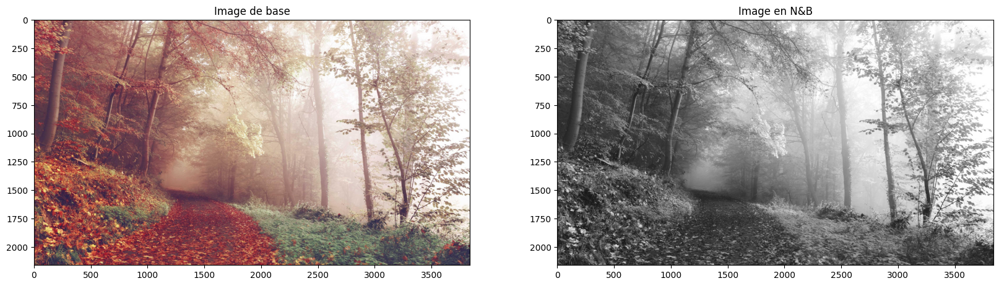

In [9]:
#Passage en grayscale

img = chooseRandomImg()

img_NB = skimage.color.rgb2gray(img)

fig, axs = plt.subplots(ncols = 2, nrows = 1, figsize = (20,20))

axs[0].imshow(img)
axs[0].set_title('Image de base')

axs[1].imshow(img_NB, cmap = plt.cm.gray)
axs[1].set_title('Image en N&B')


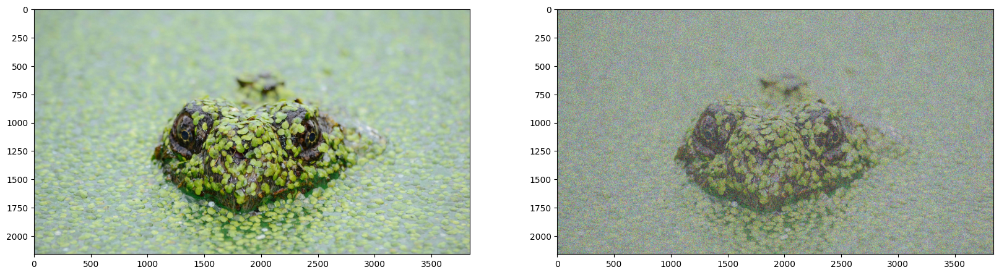

In [10]:
##Ajout de bruit

img=chooseRandomImg()
noise_img= skimage.util.random_noise(img, var=0.5)

fig, axs = plt.subplots(nrows=1 , ncols=2 , figsize=(20,20))

axs[0].imshow(img)
axs[1].imshow(noise_img)

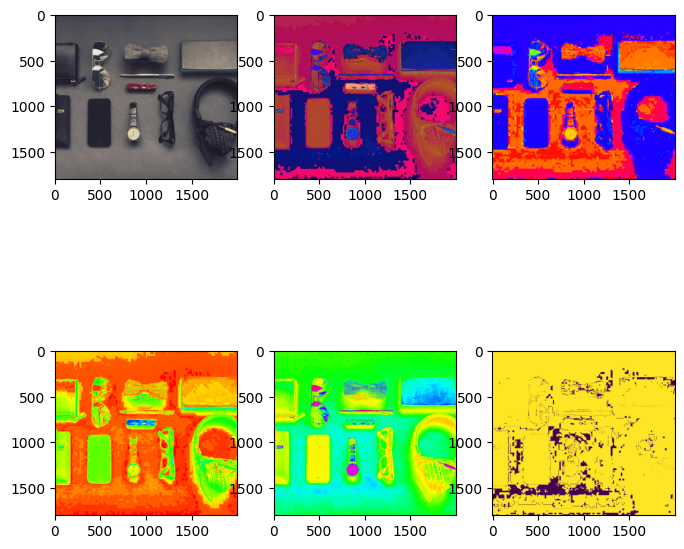

In [11]:
#Passage en HSV et seuillage
img=chooseRandomImg()
hsv_img=skimage.color.rgb2hsv(img)
hue_img=hsv_img[:,:,0]
sat_img=hsv_img[:,:,1]
val_img=hsv_img[:,:,2]

hue_threshold=0.04
val_threshold=0.02
bin_img=(hue_img > hue_threshold ) | (val_img < val_threshold)

cols=3
rows=2

fig, axs=plt.subplots(nrows=2, ncols=3, figsize=(8,8))

axs[0,0].imshow(img)
axs[0,1].imshow(hsv_img)
axs[0,2].imshow(hue_img, cmap='hsv')
axs[1,0].imshow(sat_img, cmap='hsv')
axs[1,1].imshow(val_img, cmap='hsv')
axs[1,2].imshow(bin_img)

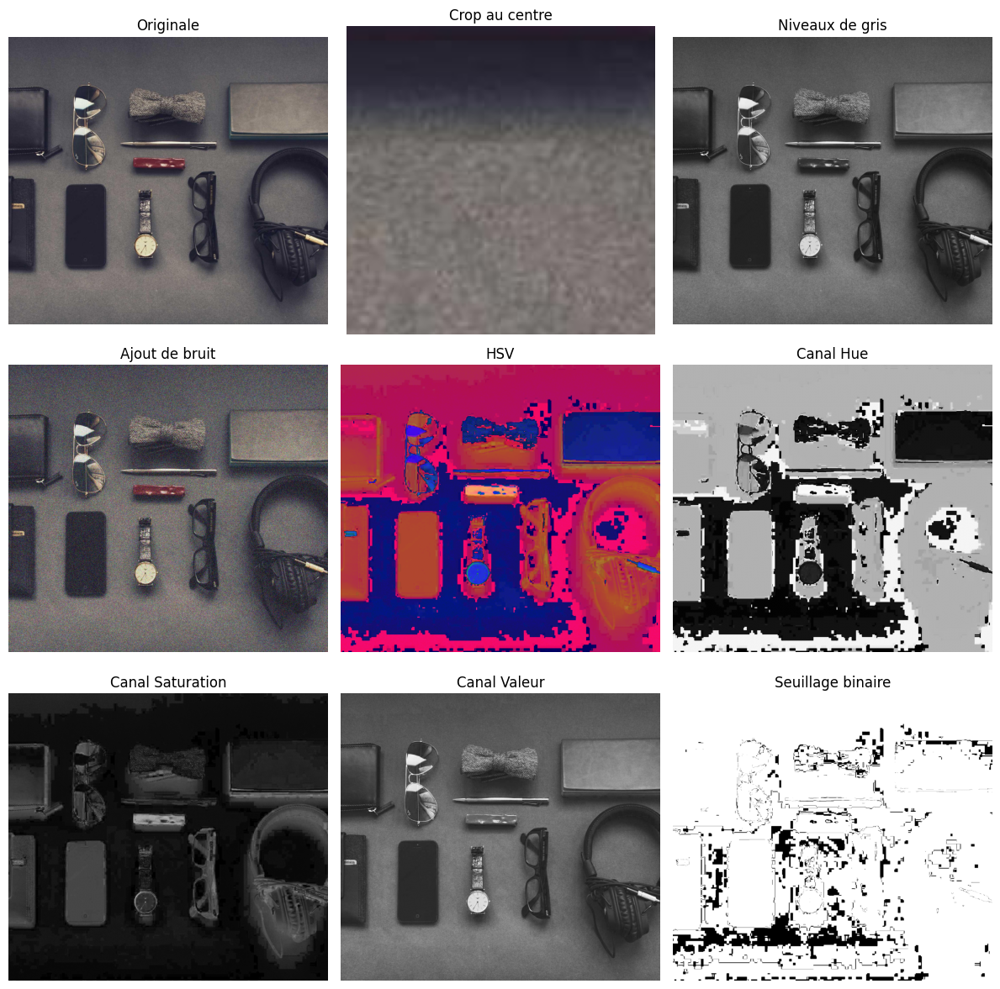

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import skimage
import pathlib
import random

def chooseRandomImg():
    return plt.imread(images[random.randint(0, len(images)-1)])

def center_crop(img, width=None, height=None):
    assert width or height, 'Précisez au moins une dimension'
    width = width or height
    height = height or width
    org_height, org_width = img.shape[:2]
    cropCenter_x, cropCenter_y = org_width // 2, org_height // 2
    dimCrop_x, dimCrop_y = width // 2, height // 2
    return img[cropCenter_y-dimCrop_y : cropCenter_y + dimCrop_y, cropCenter_x-dimCrop_x : cropCenter_x + dimCrop_x]

# Chargement du dataset
images = [f for f in pathlib.Path('photo').iterdir()]

# Sélection d'une image aléatoire
img = chooseRandomImg()

# Création des différentes transformations
cropped_img = center_crop(img, 150)
img_gray = skimage.color.rgb2gray(img)
noise_img = skimage.util.random_noise(img, var=0.05)
hsv_img = skimage.color.rgb2hsv(img)
hue_img = hsv_img[:, :, 0]
sat_img = hsv_img[:, :, 1]
val_img = hsv_img[:, :, 2]
hue_threshold = 0.04
val_threshold = 0.02
bin_img = (hue_img > hue_threshold) | (val_img < val_threshold)

# Création de la figure et affichage des images
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(12, 12))

image_list = [
    (img, 'Originale'),
    (cropped_img, 'Crop au centre'),
    (img_gray, 'Niveaux de gris'),
    (noise_img, 'Ajout de bruit'),
    (hsv_img, 'HSV'),
    (hue_img, 'Canal Hue'),
    (sat_img, 'Canal Saturation'),
    (val_img, 'Canal Valeur'),
    (bin_img, 'Seuillage binaire')
]

for ax, (image, title) in zip(axs.ravel(), image_list):
    cmap = 'gray' if len(image.shape) == 2 else None
    ax.imshow(image, cmap=cmap)
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()


9


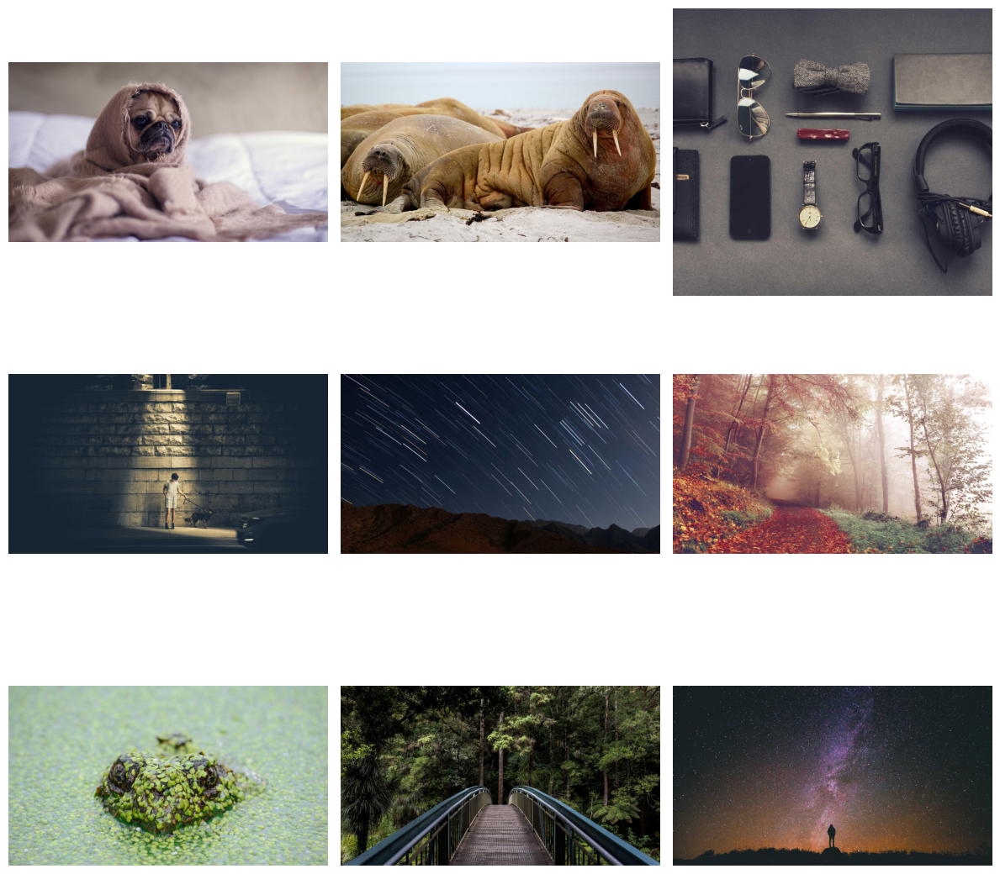

In [13]:
# Importation des librairies logicielles utilisées

# Librairies dédiées au traitement d'images
import skimage # scikit-image, qui contient toutes les fonctions que nous allons utiliser
import numpy as np # numpy, utilisée par scikit-image pour transformer les images en tableaux à plusieurs dimensions

# Librairies utilitaires
import pathlib # Pour charger automatiquement le dataset d'images
import math
import random
import matplotlib # matplotlib, pour l'affichage des images et graphiques
import matplotlib.pyplot as plt

# Chargement du dataset
images = [f for f in pathlib.Path('photo').iterdir()]
print(len(images)) # Affiche la longueur de la liste pour vérification

# Affichage de tout le dataset dans une figure sous forme de grille avec des subplots
colonnes = 3 # On veut une grille de trois colonnes
lignes = rows = math.ceil((len(images) - 1)/colonnes) # Et on calcule automatiquement l enombre de lignes nécessaires selon la taille du dataset

# On créée un objet contenant la figure globale, et un tableau à une ou deux dimensions d'objets axes
fig, axs = plt.subplots(ncols=colonnes, nrows=lignes, figsize=(12,12)) # L'argument figsize prend un couple de valeurs, et gère la taille d'affichage des subplots

# On boucle à travers les différents axes
for i, ax in enumerate(axs.flat): # L'option .flat permet de boucler à travers un tableau à deux dimensions avec un seul index
    ax.set_axis_off() # Cache les repères lors de l'affichage de l'image

    img = plt.imread(images[i])

    if img.ndim < 3: # Si l'image chargée possède moins de trois dimensions (image monocouche en noir et blanc)
        ax.imshow(img, cmap = plt.cm.gray) # On affiche l'image dans un espace colorimétrique correspondant
    else :
        ax.imshow(img)

fig.tight_layout() # Sert à réduire le plus possible les marges entre les images

Nombre d'images chargées : 9


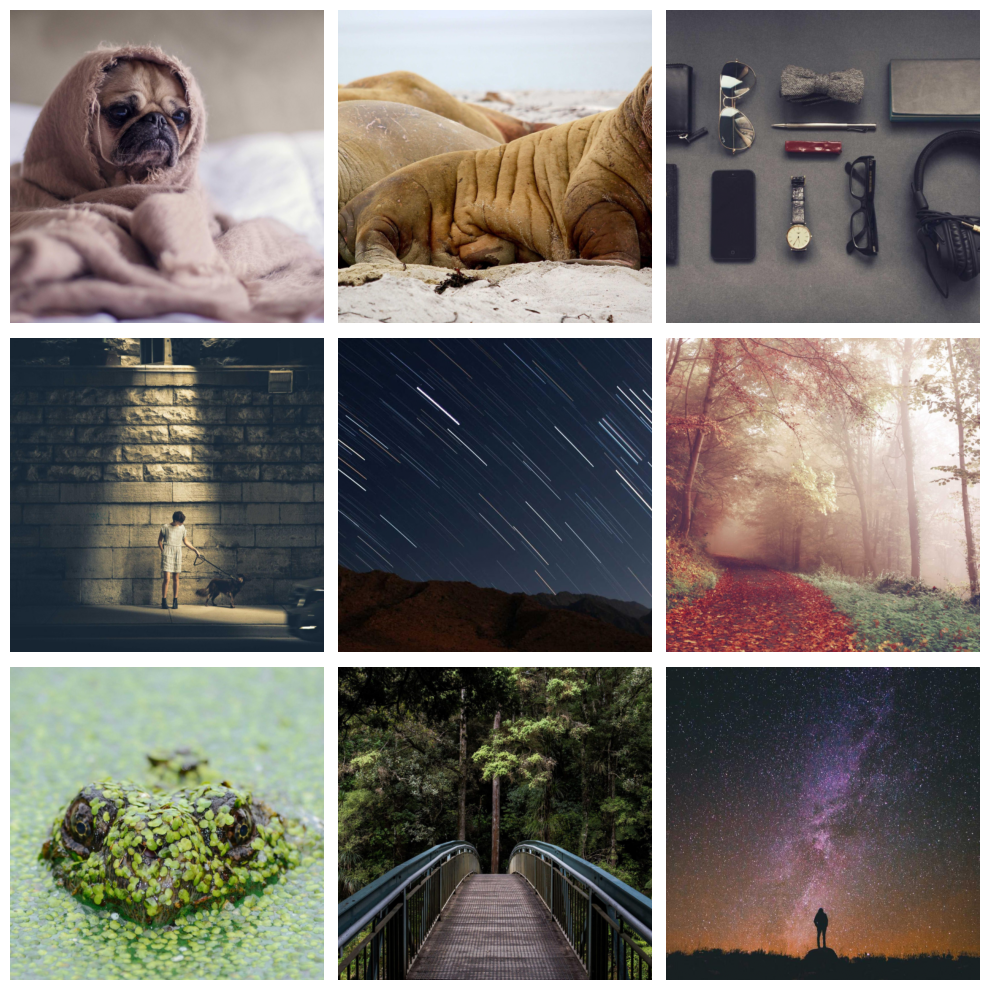

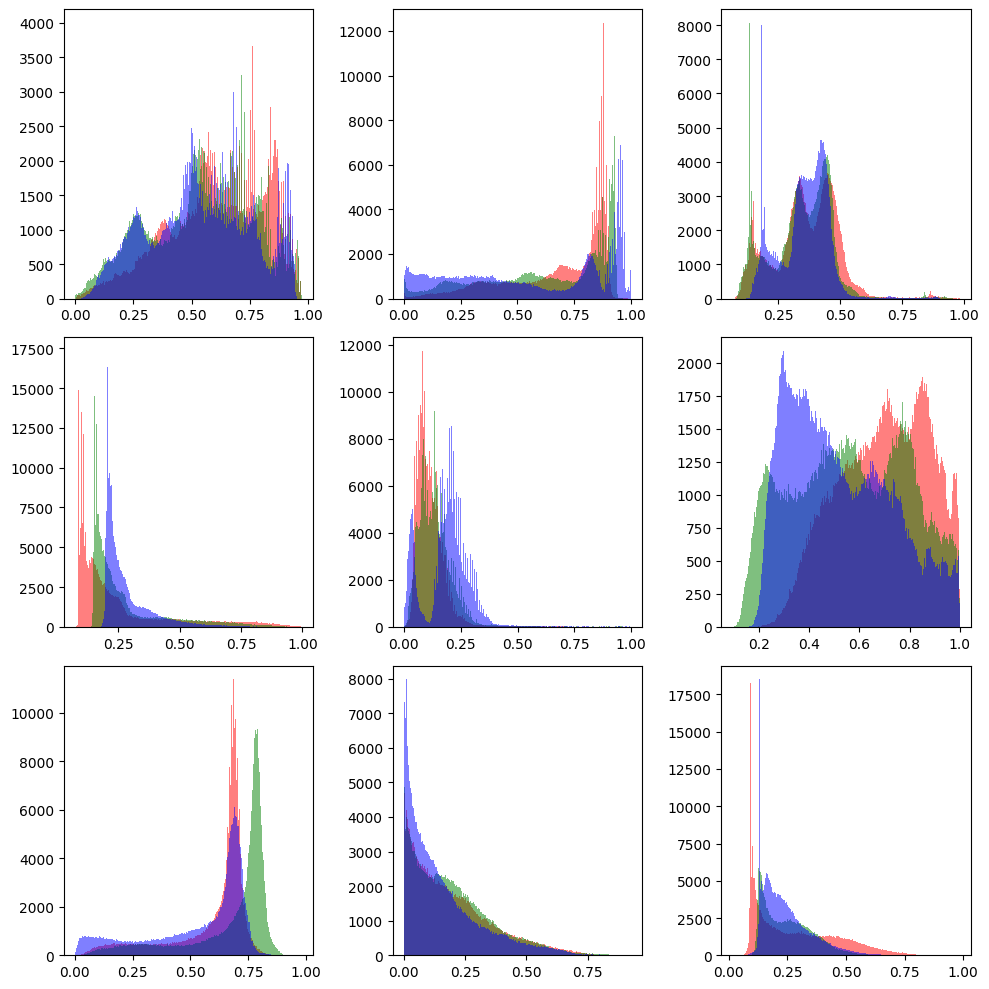

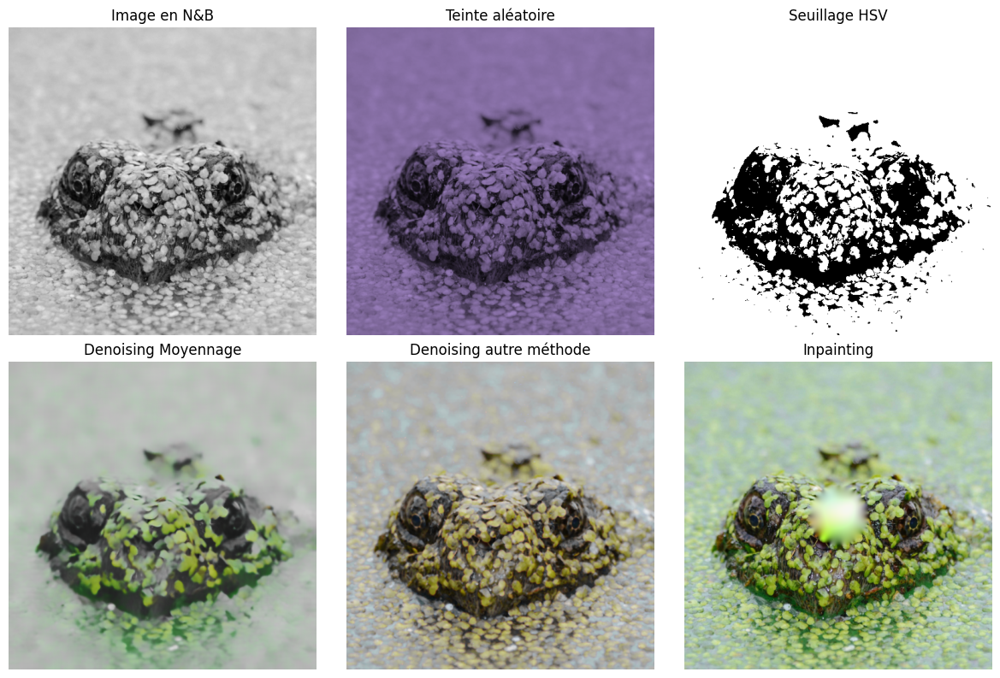

In [15]:
import pathlib
import random
import numpy as np
import skimage.io
import skimage.color
import skimage.exposure
import skimage.transform
import skimage.util
import skimage.filters
import skimage.restoration
import skimage.draw
import matplotlib.pyplot as plt

# Chargement des images depuis le dossier 'photo/'
# On récupère la liste des chemins des images dans le dossier spécifié
image_paths = list(pathlib.Path('photo').iterdir())
print(f"Nombre d'images chargées : {len(image_paths)}")

# Fonction pour redimensionner et recadrer les images à une taille cible de 512x512
# Cela permet d'assurer une uniformité des images pour les traitements ultérieurs
def resize_and_crop(img, target_size=(512, 512)):
    h, w = img.shape[:2]  # Récupération des dimensions originales
    scale = max(target_size[0] / h, target_size[1] / w)  # Calcul du facteur d'échelle
    img_resized = skimage.transform.rescale(img, scale, anti_aliasing=True, channel_axis=-1)  # Redimensionnement proportionnel
    h_resized, w_resized = img_resized.shape[:2]  # Nouvelles dimensions après redimensionnement
    start_x = (w_resized - target_size[1]) // 2  # Calcul du point de départ du recadrage horizontal
    start_y = (h_resized - target_size[0]) // 2  # Calcul du point de départ du recadrage vertical
    return img_resized[start_y:start_y + target_size[0], start_x:start_x + target_size[1]]  # Recadrage centré

# Chargement et traitement des 9 premières images pour affichage
images = [resize_and_crop(skimage.io.imread(img_path)) for img_path in image_paths[:9]]

# Affichage des images en grille 3x3
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for ax, img in zip(axes.ravel(), images):
    ax.imshow(img)  # Affichage de l'image
    ax.axis("off")  # Suppression des axes pour une meilleure visibilité
plt.tight_layout()
plt.savefig("Grille_Images.png")  # Sauvegarde de la grille d'images
plt.show()

# Génération et affichage des histogrammes des images
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for ax, img in zip(axes.ravel(), images):
    if img.ndim == 3:  # Vérification si l'image est en couleur
        for i, color in enumerate(['r', 'g', 'b']):  # Boucle sur les trois canaux (RVB)
            ax.hist(img[:, :, i].ravel(), bins=256, color=color, alpha=0.5)  # Histogramme par canal
    else:
        ax.hist(img.ravel(), bins=256, color='gray')  # Histogramme pour une image en niveaux de gris
plt.tight_layout()
plt.savefig("Grille_Histogrammes.png")  # Sauvegarde des histogrammes
plt.show()

# Sélection aléatoire d'une image parmi celles traitées
img = random.choice(images)
img_gray = skimage.color.rgb2gray(img)  # Conversion en niveaux de gris

# Génération de la grille 3x2 avec différents traitements d'image
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

# 1. Image en niveaux de gris
axes[0, 0].imshow(img_gray, cmap='gray')
axes[0, 0].set_title("Image en N&B")
axes[0, 0].axis("off")

# 2. Application d'une teinte aléatoire sur l'image en niveaux de gris
random_tint = np.random.rand(3)  # Génération de coefficients de teinte aléatoires
tinted = skimage.color.gray2rgb(img_gray) * random_tint  # Application de la teinte
axes[0, 1].imshow(tinted)
axes[0, 1].set_title("Teinte aléatoire")
axes[0, 1].axis("off")

# 3. Seuillage HSV basé sur la luminance
hsv = skimage.color.rgb2hsv(img)  # Conversion de l'image en espace de couleur HSV
thresh = hsv[:, :, 2] > skimage.filters.threshold_otsu(hsv[:, :, 2])  # Seuillage basé sur la luminance
axes[0, 2].imshow(thresh, cmap='gray')
axes[0, 2].set_title("Seuillage HSV")
axes[0, 2].axis("off")

# 4. Ajout de bruit gaussien et débruitage par moyennage
noisy_img = skimage.util.random_noise(img, mode='gaussian')  # Ajout de bruit gaussien
# Application d'un débruitage par moyennage non local
den_noisy = skimage.restoration.denoise_nl_means(noisy_img, fast_mode=True)
axes[1, 0].imshow(den_noisy)
axes[1, 0].set_title("Denoising Moyennage")
axes[1, 0].axis("off")

# 5. Ajout de bruit sel et poivre et débruitage par filtre médian
noisy_img2 = skimage.util.random_noise(img, mode='s&p')  # Ajout de bruit sel et poivre
# Filtrage médian pour réduire le bruit impulsionnel
den_noisy2 = skimage.filters.median(noisy_img2)
axes[1, 1].imshow(den_noisy2)
axes[1, 1].set_title("Denoising autre méthode")
axes[1, 1].axis("off")

# 6. Inpainting pour combler une zone masquée
mask = np.zeros(img.shape[:2], dtype=bool)  # Création d'un masque de pixels à restaurer
rr, cc = skimage.draw.disk((256, 256), 50)  # Définition d'une zone circulaire de masque
mask[rr, cc] = True  # Application du masque
# Reconstruction de la zone masquée avec l'inpainting biharmonique
inpainted = skimage.restoration.inpaint_biharmonic(img, mask, channel_axis=-1)
axes[1, 2].imshow(inpainted)
axes[1, 2].set_title("Inpainting")
axes[1, 2].axis("off")

# Affichage de la grille des traitements
plt.tight_layout()
plt.savefig("Grille_Traitements.png")  # Sauvegarde des images traitées
plt.show()
